In [6]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.style.use('ggplot')

In [7]:
data = pd.read_csv('/home/alp/Google Drive/Python/DataSets/CHI_crimes_2021.csv')

# https://data.cityofchicago.org/resource/x2n5-8w5q.json

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235738 entries, 0 to 235737
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   CASE#                   235738 non-null  object 
 1   DATE  OF OCCURRENCE     235738 non-null  object 
 2   BLOCK                   235738 non-null  object 
 3    IUCR                   235738 non-null  object 
 4    PRIMARY DESCRIPTION    235738 non-null  object 
 5    SECONDARY DESCRIPTION  235738 non-null  object 
 6    LOCATION DESCRIPTION   235081 non-null  object 
 7   ARREST                  235738 non-null  object 
 8   DOMESTIC                235738 non-null  object 
 9   BEAT                    235738 non-null  int64  
 10  WARD                    235729 non-null  float64
 11  FBI CD                  235738 non-null  object 
 12  X COORDINATE            233527 non-null  float64
 13  Y COORDINATE            233527 non-null  float64
 14  LATITUDE            

In [9]:
data.head()

,CASE#,DATE OF OCCURRENCE,BLOCK,IUCR,PRIMARY DESCRIPTION,SECONDARY DESCRIPTION,LOCATION DESCRIPTION,ARREST,DOMESTIC,BEAT,WARD,FBI CD,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION
0,JF129769,01/29/2022 11:55:00 PM,019XX W Fulton ST,0810,THEFT,OVER $500,STREET,N,N,1223,27.0,06,NaN,NaN,NaN,NaN,NaN
1,JF128810,01/29/2022 12:02:00 PM,059XX N MANTON AVE,1150,DECEPTIVE PRACTICE,CREDIT CARD FRAUD,RESIDENCE,N,N,1622,39.0,11,NaN,NaN,NaN,NaN,NaN
2,JF129790,01/29/2022 07:35:00 PM,002XX S WABASH AVE,0890,THEFT,FROM BUILDING,BAR OR TAVERN,N,N,113,42.0,06,NaN,NaN,NaN,NaN,NaN
3,JF238175,05/11/2022 11:25:00 AM,002XX W MADISON ST,0860,THEFT,RETAIL THEFT,DRUG STORE,N,N,122,42.0,06,NaN,NaN,NaN,NaN,NaN
4,JF172582,03/13/2022 01:44:00 AM,018XX W ROSCOE ST,1310,CRIMINAL DAMAGE,TO PROPERTY,RESIDENCE,N,N,1922,47.0,14,NaN,NaN,NaN,NaN,NaN


In [10]:
data.columns


Index(['CASE#', 'DATE  OF OCCURRENCE', 'BLOCK', ' IUCR',
       ' PRIMARY DESCRIPTION', ' SECONDARY DESCRIPTION',
       ' LOCATION DESCRIPTION', 'ARREST', 'DOMESTIC', 'BEAT', 'WARD', 'FBI CD',
       'X COORDINATE', 'Y COORDINATE', 'LATITUDE', 'LONGITUDE', 'LOCATION'],
      dtype='object')

Before we do anything else, let's clean up the column names and make them easier to use.

The next cell creates a data dictionary (dd). It cycles through the columns, strips out leading/trailing spaces, and converts them to lower case. It then renames the columns with these new versions.

In [11]:
dd = {}
for col in list(data.columns):
    dd[col] = col.strip().lower()
data.rename(columns = dd, inplace = True)

data.columns

Index(['case#', 'date  of occurrence', 'block', 'iucr', 'primary description',
       'secondary description', 'location description', 'arrest', 'domestic',
       'beat', 'ward', 'fbi cd', 'x coordinate', 'y coordinate', 'latitude',
       'longitude', 'location'],
      dtype='object')

Better. But some are still too long, complex. I'm going to change several manually. 

And I'm going to delete the XY coordinates. They are superflouus since I've got lat/long data that I can use with mapping software. 

In [12]:
data.rename(columns = {'date  of occurrence':'date','primary description':'desc1', 'secondary description':'desc2','location description':'location_desc'},inplace = True)
data.drop(columns = ['x coordinate', 'y coordinate'],inplace = True)
data.columns

Index(['case#', 'date', 'block', 'iucr', 'desc1', 'desc2', 'location_desc',
       'arrest', 'domestic', 'beat', 'ward', 'fbi cd', 'latitude', 'longitude',
       'location'],
      dtype='object')

We need to add a couple of columns. First, when Pandas imported the data, it treated the DATE OF OCCURRENCE as a string. We need to make it into a datetime field.

In [13]:
data['dt'] = pd.to_datetime(data['date'],infer_datetime_format=True)

The IUCR field is a numeric code that matches PRIMARY and SECONDARY descriptions:
0810:
 * 08 = "THEFT"
 * 10 = "OVER $500"

Unfortunately, the IUCR code isn't entirely regular (we can't split it into first-two, second-two characters). And there are times when it's convenient to have it, so we'll keep it.

But for many of our analyses, it will be easier to run queries on the primary and secondary fields, so we'll combine them.


In [14]:
data['iucr_desc'] = data.apply(lambda row: row.desc1 + '-' + row.desc2,axis = 1)

In [17]:
data.head(5)

,case#,date,block,iucr,desc1,desc2,location_desc,arrest,domestic,beat,ward,fbi cd,latitude,longitude,location,dt,iucr_desc
0,JF129769,01/29/2022 11:55:00 PM,019XX W Fulton ST,0810,THEFT,OVER $500,STREET,N,N,1223,27.0,06,NaN,NaN,NaN,2022-01-29 23:55:00,THEFT-OVER $500
1,JF128810,01/29/2022 12:02:00 PM,059XX N MANTON AVE,1150,DECEPTIVE PRACTICE,CREDIT CARD FRAUD,RESIDENCE,N,N,1622,39.0,11,NaN,NaN,NaN,2022-01-29 12:02:00,DECEPTIVE PRACTICE-CREDIT CARD FRAUD
2,JF129790,01/29/2022 07:35:00 PM,002XX S WABASH AVE,0890,THEFT,FROM BUILDING,BAR OR TAVERN,N,N,113,42.0,06,NaN,NaN,NaN,2022-01-29 19:35:00,THEFT-FROM BUILDING
3,JF238175,05/11/2022 11:25:00 AM,002XX W MADISON ST,0860,THEFT,RETAIL THEFT,DRUG STORE,N,N,122,42.0,06,NaN,NaN,NaN,2022-05-11 11:25:00,THEFT-RETAIL THEFT
4,JF172582,03/13/2022 01:44:00 AM,018XX W ROSCOE ST,1310,CRIMINAL DAMAGE,TO PROPERTY,RESIDENCE,N,N,1922,47.0,14,NaN,NaN,NaN,2022-03-13 01:44:00,CRIMINAL DAMAGE-TO PROPERTY


In [18]:
data.describe(include='all')

/tmp/ipykernel_73869/1336221646.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data.describe(include='all')


,case#,date,block,iucr,desc1,desc2,location_desc,arrest,domestic,beat,ward,fbi cd,latitude,longitude,location,dt,iucr_desc
count,235738,235738,235738,235738,235738,235738,235081,235738,235738,235738.000000,235729.000000,235738,233527.000000,233527.000000,233527,235738,235738
unique,235691,111628,27793,302,31,281,134,2,2,NaN,NaN,26,NaN,NaN,117774,111628,302
top,JF505994,08/01/2022 12:00:00 AM,001XX N STATE ST,0810,THEFT,SIMPLE,STREET,N,N,NaN,NaN,06,NaN,NaN,"(41.976290414, -87.905227221)",2022-08-01 00:00:00,THEFT-OVER $500
freq,3,86,605,19916,54294,27123,67552,209513,193500,NaN,NaN,54294,NaN,NaN,306,86,19916
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-03 05:15:00,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-01-02 23:59:00,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1152.488279,23.353677,NaN,41.845477,-87.668522,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,708.383278,14.221235,NaN,0.088831,0.060978,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,111.000000,1.000000,NaN,36.619446,-91.686566,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,533.000000,9.000000,NaN,41.769053,-87.710137,NaN,NaN,NaN


Walsh's SOP doesn't work so well on this data: there are almost no numeric fields that are worth examining!

What are the top 20 types of crimes reported by the CPD?

In [21]:
data[['iucr_desc']].value_counts(normalize=True)[:20]

iucr_desc                                             
THEFT-OVER $500                                           0.084484
THEFT-$500 AND UNDER                                      0.079033
BATTERY-DOMESTIC BATTERY SIMPLE                           0.078986
MOTOR VEHICLE THEFT-AUTOMOBILE                            0.072691
CRIMINAL DAMAGE-TO VEHICLE                                0.060440
BATTERY-SIMPLE                                            0.058005
ASSAULT-SIMPLE                                            0.055816
CRIMINAL DAMAGE-TO PROPERTY                               0.051388
THEFT-RETAIL THEFT                                        0.036952
WEAPONS VIOLATION-UNLAWFUL POSSESSION - HANDGUN           0.022983
THEFT-FROM BUILDING                                       0.019874
ASSAULT-AGGRAVATED - HANDGUN                              0.019789
BURGLARY-FORCIBLE ENTRY                                   0.017609
ROBBERY-ARMED - HANDGUN                                   0.015148
OTHER O

In [22]:
data[['iucr_desc']].value_counts(normalize=True)[:20].cumsum()

iucr_desc                                             
THEFT-OVER $500                                           0.084484
THEFT-$500 AND UNDER                                      0.163516
BATTERY-DOMESTIC BATTERY SIMPLE                           0.242502
MOTOR VEHICLE THEFT-AUTOMOBILE                            0.315193
CRIMINAL DAMAGE-TO VEHICLE                                0.375633
BATTERY-SIMPLE                                            0.433638
ASSAULT-SIMPLE                                            0.489454
CRIMINAL DAMAGE-TO PROPERTY                               0.540842
THEFT-RETAIL THEFT                                        0.577794
WEAPONS VIOLATION-UNLAWFUL POSSESSION - HANDGUN           0.600777
THEFT-FROM BUILDING                                       0.620651
ASSAULT-AGGRAVATED - HANDGUN                              0.640440
BURGLARY-FORCIBLE ENTRY                                   0.658048
ROBBERY-ARMED - HANDGUN                                   0.673197
OTHER O

The ten-most often reported crimes account for about 60% of all crimes reported.

Where are ROBBERIES taking place?

In [15]:
data[data['desc1'] == 'ROBBERY']['location_desc'].value_counts()[:15]

STREET                                    3419
SIDEWALK                                  1913
ALLEY                                      547
PARKING LOT / GARAGE (NON RESIDENTIAL)     346
SMALL RETAIL STORE                         334
GAS STATION                                281
CTA TRAIN                                  261
APARTMENT                                  255
RESIDENCE                                  195
RESTAURANT                                 126
CONVENIENCE STORE                          119
VEHICLE NON-COMMERCIAL                      96
CTA PLATFORM                                89
CTA BUS STOP                                79
BANK                                        79
Name: location_desc, dtype: int64

What sorts of crimes report gun usage?

In [25]:
data[ (data['desc2'].str.contains('GUN')) | (data['desc2'].str.contains('FIREARM')) ]['desc1'].value_counts()

WEAPONS VIOLATION          8618
ASSAULT                    4888
ROBBERY                    4006
BATTERY                    2151
OTHER OFFENSE               354
CRIMINAL SEXUAL ASSAULT      64
Name: desc1, dtype: int64

Let's drill into the GUN / ASSAULT cases.

In [26]:
data[(data['desc2'].str.contains('GUN')) & (data['desc1'] == 'ASSAULT')]

,case#,date,block,iucr,desc1,desc2,location_desc,arrest,domestic,beat,ward,fbi cd,latitude,longitude,location,dt,iucr_desc
438,JF123238,01/25/2022 12:36:00 AM,001XX W CONGRESS PKWY,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,Y,N,123,4.0,04A,NaN,NaN,NaN,2022-01-25 00:36:00,ASSAULT-AGGRAVATED - HANDGUN
2174,JF524732,12/28/2022 02:20:00 AM,101XX S AVENUE L,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,N,N,432,10.0,04A,41.711248,-87.536488,"(41.711247981, -87.536487866)",2022-12-28 02:20:00,ASSAULT-AGGRAVATED - HANDGUN
2318,JG103128,07/15/2022 07:00:00 AM,007XX E 65TH ST,051A,ASSAULT,AGGRAVATED - HANDGUN,APARTMENT,N,Y,321,20.0,04A,NaN,NaN,NaN,2022-07-15 07:00:00,ASSAULT-AGGRAVATED - HANDGUN
2387,JF525611,12/28/2022 06:10:00 PM,095XX S GREEN ST,051A,ASSAULT,AGGRAVATED - HANDGUN,RESIDENCE,N,Y,2223,21.0,04A,41.720651,-87.644408,"(41.720650649, -87.644407948)",2022-12-28 18:10:00,ASSAULT-AGGRAVATED - HANDGUN
2444,JF525721,12/28/2022 08:52:00 PM,037XX S STATE ST,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,N,N,213,3.0,04A,41.827103,-87.626471,"(41.827102603, -87.626470891)",2022-12-28 20:52:00,ASSAULT-AGGRAVATED - HANDGUN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235079,JF244200,05/16/2022 11:05:00 AM,055XX S OAKLEY AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,N,N,824,15.0,04A,41.793099,-87.681272,"(41.793098586, -87.681272006)",2022-05-16 11:05:00,ASSAULT-AGGRAVATED - HANDGUN
235160,JF116163,01/18/2022 01:06:00 AM,018XX S WESTERN AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,N,N,1234,25.0,04A,41.857431,-87.685817,"(41.857430827, -87.685816748)",2022-01-18 01:06:00,ASSAULT-AGGRAVATED - HANDGUN
235320,JF196211,04/03/2022 08:30:00 PM,045XX S ROCKWELL ST,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,N,N,922,15.0,04A,41.811767,-87.689420,"(41.811767256, -87.689420488)",2022-04-03 20:30:00,ASSAULT-AGGRAVATED - HANDGUN
235544,JF329523,07/23/2022 04:30:00 PM,050XX S EAST END AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,WAREHOUSE,N,N,222,5.0,04A,41.803061,-87.585426,"(41.803060829, -87.585426093)",2022-07-23 16:30:00,ASSAULT-AGGRAVATED - HANDGUN


How many of these crimes are domestic assaults?

How many of these crimes resulted in arrests?

In [27]:
data[(data['desc2'].str.contains('GUN')) & (data['desc1'] == 'ASSAULT')]['domestic'].value_counts(normalize=True)

N    0.73146
Y    0.26854
Name: domestic, dtype: float64

In [28]:
data[(data['desc2'].str.contains('GUN')) & (data['desc1'] == 'ASSAULT')]['arrest'].value_counts(normalize=True)

N    0.883795
Y    0.116205
Name: arrest, dtype: float64

Of "assaults" conducted with "gun," 26% were domestic violence reports.
Of all these assaults, only 11% resulted in arrests.

What percent of all crimes result in arrests?

In [29]:
data['arrest'].value_counts(normalize=True)

N    0.888754
Y    0.111246
Name: arrest, dtype: float64

Only 11%? that seems REALLY low.

Where do crimes happen?

<AxesSubplot: >

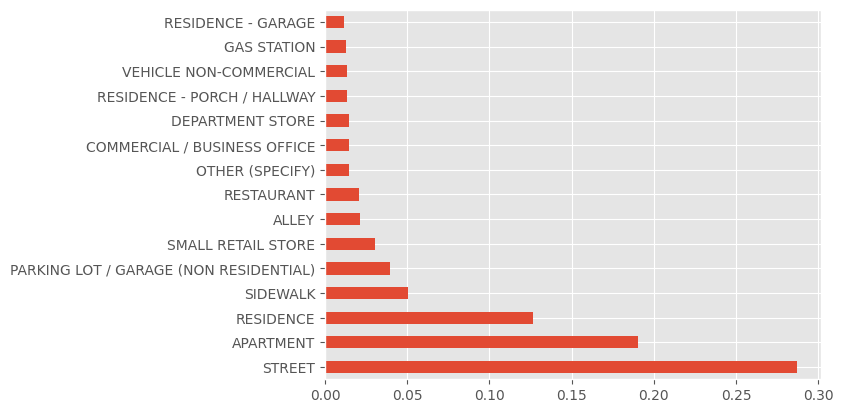

In [30]:
data['location_desc'].value_counts(normalize=True)[:15].plot(kind='barh')

Of the 50 wards, which have the most crime?

In [31]:
data['ward'].value_counts(normalize=True).reset_index()[:5]

,index,ward
0,42.0,0.053562
1,27.0,0.046676
2,28.0,0.042159
3,6.0,0.036147
4,24.0,0.033975


<AxesSubplot: >

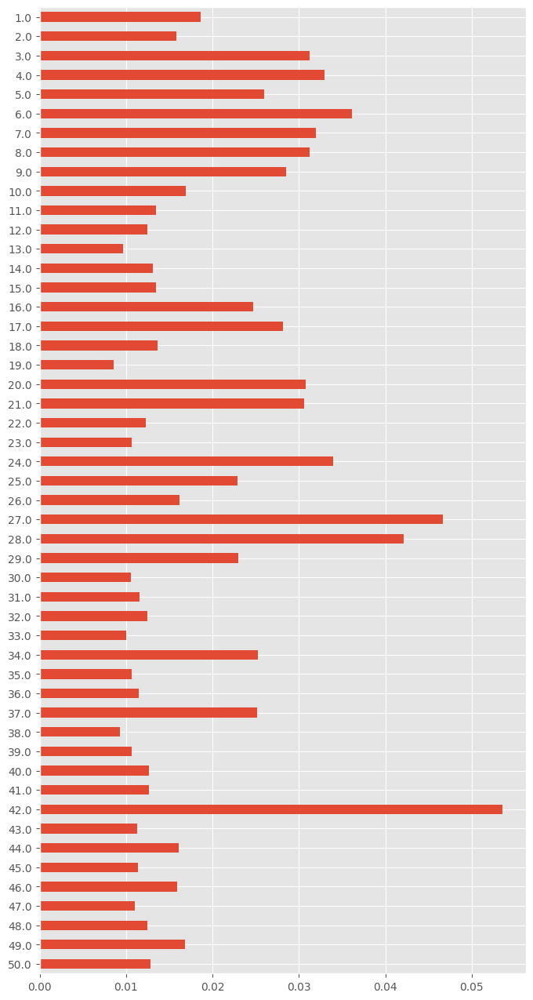

In [32]:
data['ward'].value_counts(normalize=True).sort_index(ascending=False).plot(kind='barh',figsize=(8,16))

This is not very helpful, unless you know the different aldermanic wards! Let's map the data instead.

First we need to convert the value_counts() information from the graph above into a DF.

In [234]:
ward_crime = pd.DataFrame(data['ward'].value_counts(normalize=True).sort_index(ascending=False).reset_index())
ward_crime[:5]


,index,ward
0,50.0,0.012811
1,49.0,0.016837
2,48.0,0.012489
3,47.0,0.010996
4,46.0,0.015929


In [236]:
# Annoying -- the column names are incorrect. Rename them to avoid confusion.
ward_crime.rename(columns={'index':'ward','ward':'crime_ratio'},inplace = True)
ward_crime.head()

,ward,crime_ratio
0,50.0,0.012811
1,49.0,0.016837
2,48.0,0.012489
3,47.0,0.010996
4,46.0,0.015929


Next, we need to get the geographic boundaries for the different wards. We can get these from the CHI data portal.

In [36]:
import geopandas as gpd
wards_df = gpd.read_file('https://data.cityofchicago.org/api/geospatial/sp34-6z76?method=export&format=GeoJSON')
#beats = gpd.read_file(dfile)
wards_df['ward'] = pd.to_numeric(wards_df['ward'])


In [37]:
wards_df.head()

,shape_area,shape_leng,ward,geometry
0,116096507.849,93073.3408379,12,"MULTIPOLYGON (((-87.69623 41.85755, -87.69625 ..."
1,103143638.546,97901.3238332,16,"MULTIPOLYGON (((-87.66289 41.79884, -87.66289 ..."
2,65588297.917,82183.6948197,15,"MULTIPOLYGON (((-87.69818 41.81729, -87.69817 ..."
3,137290356.97,90105.1956185,20,"MULTIPOLYGON (((-87.65524 41.80883, -87.65524 ..."
4,49733459.1385,38122.6928259,49,"MULTIPOLYGON (((-87.66420 42.02126, -87.66419 ..."


In [38]:
# not really necessary, but we're not going to do anything with the area or circumference (length), so we'll drop them
wards_df.drop(columns = ['shape_area', 'shape_leng'],inplace = True)

Now we can map the data...

In [39]:
import folium

m = folium.Map(location=[data['latitude'].mean(),data['longitude'].mean()],tiles='Stamen Terrain',zoom_start = 10)
# 

cp = folium.Choropleth(
    geo_data = wards_df,
    name = 'choropleth',
    data = ward_crime,
    columns = ['ward','crime_ratio'],
    key_on='feature.properties.ward',
    fill_color='OrRd',
    fill_opacity=0.8,
    line_opacity=0.2,
    nan_fill_color = 'grey',
    legend_name='Crime ratio (of all CHI crimes)',
    ).add_to(m)

# iterate over the geojson data for the map (cp)
# it already has the ward numbers, but we need to add the crime_ratio information to it
# we will then add that data (via GeoJsonTooltip) to the map

hover_data = ward_crime.set_index('ward')
for row in cp.geojson.data['features']:
    try:
        row['properties']['crimeRatio'] = f"{hover_data.loc[row['properties']['ward'],'crime_ratio']:.4f}"
    except KeyError:
        row['properties']['crimeRatio'] = 'No Data'

folium.GeoJsonTooltip(['ward','crimeRatio'],
    aliases=['Ward:','Crime Ratio:']).add_to(cp.geojson)

m



It's pretty easy to change this map to display crime-by-beat.

We just need to read in the proper boundary data files and re-calculate the crimes-per-area.

In [74]:
beat_crime = pd.DataFrame(data['beat'].value_counts(normalize=True).sort_index(ascending=False).reset_index())
beat_crime.rename(columns={'index':'beat','beat':'crime_ratio'},inplace = True)
beat_crime.head()

,beat,crime_ratio
0,2535,0.003160
1,2534,0.004344
2,2533,0.005133
3,2532,0.004068
4,2531,0.002681


In [49]:
beats_url = 'https://data.cityofchicago.org/api/geospatial/aerh-rz74?method=export&format=GeoJSON'

#dfile = '/home/alp/Downloads/Boundaries - Police Beats (current).geojson'
# add the beat outlines to the map

beat_map = gpd.read_file(beats_url)
#beats = gpd.read_file(dfile)
#wards_df['ward'] = pd.to_numeric(wards_df['ward'])
beat_map.head()

,beat,beat_num,district,sector,geometry
0,1,1713,17,1,"MULTIPOLYGON (((-87.70473 41.97577, -87.70472 ..."
1,0,3100,31,0,"MULTIPOLYGON (((-87.83365 41.97535, -87.83366 ..."
2,5,1651,16,5,"MULTIPOLYGON (((-87.90684 41.97656, -87.91070 ..."
3,1,1914,19,1,"MULTIPOLYGON (((-87.64492 41.96973, -87.64431 ..."
4,1,1915,19,1,"MULTIPOLYGON (((-87.63724 41.96599, -87.63644 ..."


In [50]:
beat_map.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 277 entries, 0 to 276
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   beat      277 non-null    object  
 1   beat_num  277 non-null    object  
 2   district  277 non-null    object  
 3   sector    277 non-null    object  
 4   geometry  277 non-null    geometry
dtypes: geometry(1), object(4)
memory usage: 10.9+ KB


In [51]:
beat_crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 274 entries, 0 to 273
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   beat         274 non-null    int64  
 1   crime_ratio  274 non-null    float64
dtypes: float64(1), int64(1)
memory usage: 4.4 KB


In [75]:
# the police records treat "beat" as a number, but the beat_map geojson has them as strings

# add a column with the beat number converted to a string with leading zeros
# (to match the GeoJSON data)
beat_crime['beat_str'] = beat_crime['beat'].apply('{:0>4}'.format)
beat_crime.head()

,beat,crime_ratio,beat_str
0,2535,0.003160,2535
1,2534,0.004344,2534
2,2533,0.005133,2533
3,2532,0.004068,2532
4,2531,0.002681,2531


In [85]:
import folium

m1 = folium.Map(location=[data['latitude'].mean(),data['longitude'].mean()],tiles='Stamen Terrain',zoom_start = 10)
# 

cp = folium.Choropleth(
    geo_data = beat_map,
    name = 'choropleth',
    data = beat_crime,
    columns = ['beat_str','crime_ratio'],
    key_on='feature.properties.beat_num',
    fill_color='OrRd',
    fill_opacity=0.8,
    line_opacity=0.2,
    nan_fill_color = 'grey',
    legend_name='Crime ratio (of all CHI crimes)',
    ).add_to(m1)

# iterate over the geojson data for the map (cp)
# it already has the ward numbers, but we need to add the crime_ratio information to it
# we will then add that data (via GeoJsonTooltip) to the map

hover_data = beat_crime.set_index('beat_str')
for row in cp.geojson.data['features']:
    try:
        row['properties']['crimeRatio'] = f"{hover_data.loc[row['properties']['beat_num'],'crime_ratio']:.4f}"
    except KeyError:
        row['properties']['crimeRatio'] = 'No Data'

folium.GeoJsonTooltip(['beat_num','crimeRatio'],
    aliases=['Beat:','Crime Ratio:']).add_to(cp.geojson)

m1



One problem with Folium chlorophot maps is that the scale includes all the values, including outliers. This results in a lack of distinctions in the different regions, because if there are outliers, the scale needs to extend to cover them. 

Let's check the beats_crime df for outliers. This is easy to do with a box plot, which shows (in the box) where 50% of the data resides. 
 * So the bottom of the box 25% of the data, the top of the box = 75% of the data.
 * The line inside the box is the mean value for the dataset.
 * The IQR (interquartile range) = top - bottom
 * The whiskers extend (at most) 1.5 * IQR:
    * top whisker = BoxTop + 1.5 IQR (or the largest value in the dataset)
    * bottom whisker = BoxBottom - 1.5 * IQR (or the smallest value in the dataset)
 * Values that are beyond the whiskers are represented as dots, and are considered outliers

By plotting the box, we can quickly see about how many outliers there are.

<AxesSubplot: >

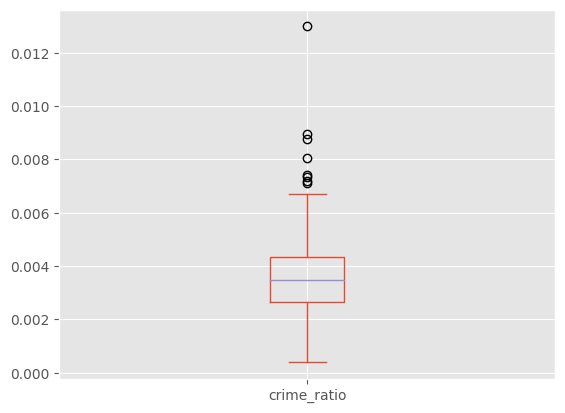

In [81]:
beat_crime['crime_ratio'].plot(kind='box')

This shows there are a number of outliers, including one WAY outlier. Let's add a value to the DF just for the map scale of the mean + 3SD.

In [82]:
maxValue = beat_crime['crime_ratio'].mean() + 3 * beat_crime['crime_ratio'].std()
beat_crime['crime_ratio_scale'] = beat_crime['crime_ratio'].apply(lambda x: x if x < maxValue else maxValue)

<AxesSubplot: >

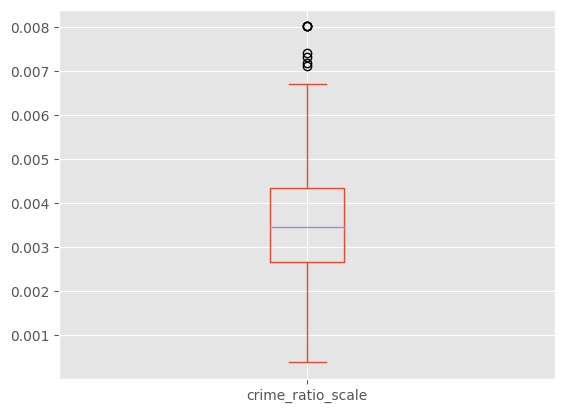

In [83]:
beat_crime['crime_ratio_scale'].plot(kind='box')

With our scale cap, the range goes from almost zero to 0.008, rather than zero to 0.013. The number of points that have the 0.008 value would be pretty high (since that's where all the values > 0.008 ended up), but this will allow our map to distinguish more gradients in the bulk of the data.

Now, redo the map

In [84]:
import folium

m2 = folium.Map(location=[data['latitude'].mean(),data['longitude'].mean()],tiles='Stamen Terrain',zoom_start = 10)
# 

cp = folium.Choropleth(
    geo_data = beat_map,
    name = 'choropleth',
    data = beat_crime,
    columns = ['beat_str','crime_ratio_scale'],
    key_on='feature.properties.beat_num',
    fill_color='OrRd',
    fill_opacity=0.8,
    line_opacity=0.2,
    nan_fill_color = 'grey',
    legend_name='Crime ratio (of all CHI crimes)',
    ).add_to(m2)

# iterate over the geojson data for the map (cp)
# it already has the ward numbers, but we need to add the crime_ratio information to it
# we will then add that data (via GeoJsonTooltip) to the map

hover_data = beat_crime.set_index('beat_str')
for row in cp.geojson.data['features']:
    try:
        row['properties']['crimeRatio'] = f"{hover_data.loc[row['properties']['beat_num'],'crime_ratio']:.4f}"
    except KeyError:
        row['properties']['crimeRatio'] = 'No Data'

folium.GeoJsonTooltip(['beat_num','crimeRatio'],
    aliases=['Beat:','Crime Ratio:']).add_to(cp.geojson)

m2



In [86]:
m1.save('beat_crime.html')
m2.save('beat_crime_scale_adj.html')

Are the same crimes committed in each ward? Let's graph the most common crimes in the five highest crime wards. . . 

This is surprisingly difficult!

Steps: create a list of the 10 most common crimes (next couple of cells)

In [41]:
data[['iucr_desc']].value_counts(normalize=True)[:10].cumsum()

iucr_desc                                      
THEFT-OVER $500                                    0.084484
THEFT-$500 AND UNDER                               0.163516
BATTERY-DOMESTIC BATTERY SIMPLE                    0.242502
MOTOR VEHICLE THEFT-AUTOMOBILE                     0.315193
CRIMINAL DAMAGE-TO VEHICLE                         0.375633
BATTERY-SIMPLE                                     0.433638
ASSAULT-SIMPLE                                     0.489454
CRIMINAL DAMAGE-TO PROPERTY                        0.540842
THEFT-RETAIL THEFT                                 0.577794
WEAPONS VIOLATION-UNLAWFUL POSSESSION - HANDGUN    0.600777
dtype: float64

In [233]:
common_crimes = data[['iucr_desc']].value_counts(normalize=True)[:10].reset_index()
common_crimes

,iucr_desc,0
0,THEFT-OVER $500,0.084484
1,THEFT-$500 AND UNDER,0.079033
2,BATTERY-DOMESTIC BATTERY SIMPLE,0.078986
3,MOTOR VEHICLE THEFT-AUTOMOBILE,0.072691
4,CRIMINAL DAMAGE-TO VEHICLE,0.060440
5,BATTERY-SIMPLE,0.058005
6,ASSAULT-SIMPLE,0.055816
7,CRIMINAL DAMAGE-TO PROPERTY,0.051388
8,THEFT-RETAIL THEFT,0.036952
9,WEAPONS VIOLATION-UNLAWFUL POSSESSION - HANDGUN,0.022983


In [100]:
common_crimes.rename(columns={0:'crime_ratio'},inplace = True)
common_crimes

,iucr_desc,crime_ratio
0,THEFT-OVER $500,0.084484
1,THEFT-$500 AND UNDER,0.079033
2,BATTERY-DOMESTIC BATTERY SIMPLE,0.078986
3,MOTOR VEHICLE THEFT-AUTOMOBILE,0.072691
4,CRIMINAL DAMAGE-TO VEHICLE,0.060440
5,BATTERY-SIMPLE,0.058005
6,ASSAULT-SIMPLE,0.055816
7,CRIMINAL DAMAGE-TO PROPERTY,0.051388
8,THEFT-RETAIL THEFT,0.036952
9,WEAPONS VIOLATION-UNLAWFUL POSSESSION - HANDGUN,0.022983


In [101]:
list(common_crimes['iucr_desc'])

['THEFT-OVER $500',
 'THEFT-$500 AND UNDER',
 'BATTERY-DOMESTIC BATTERY SIMPLE',
 'MOTOR VEHICLE THEFT-AUTOMOBILE',
 'CRIMINAL DAMAGE-TO VEHICLE',
 'BATTERY-SIMPLE',
 'ASSAULT-SIMPLE',
 'CRIMINAL DAMAGE-TO PROPERTY',
 'THEFT-RETAIL THEFT',
 'WEAPONS VIOLATION-UNLAWFUL POSSESSION - HANDGUN']

Next, we need a list of the wards with the highest crime rates. . . 

In [42]:
data['ward'].value_counts(normalize=True).reset_index()[:5]

,index,ward
0,42.0,0.053562
1,69.0,0.100238
2,97.0,0.142397
3,103.0,0.178544
4,127.0,0.212519


If we group the data by "ward" and "IUCR description" we will get a long list, ordered by ward number, and then by IUCR descriptions. Since there is a "case#" for each row, we will count those to find the number of XXX crimes in YYY ward.

In [102]:
temp = data.groupby(['ward','iucr_desc'],as_index=False)['case#'].count()
temp.head()

,ward,iucr_desc,case#
0,1.0,ARSON-BY FIRE,6
1,1.0,ASSAULT-AGGRAVATED - HANDGUN,53
2,1.0,ASSAULT-AGGRAVATED - KNIFE / CUTTING INSTRUMENT,17
3,1.0,ASSAULT-AGGRAVATED - OTHER DANGEROUS WEAPON,15
4,1.0,ASSAULT-AGGRAVATED - OTHER FIREARM,1


How can we access this? Let's mess around to see how to get an N for a given Ward and ICRU description . . .

In [128]:
list(temp[(temp['ward']==42) & (temp['iucr_desc'] == 'THEFT-OVER $500')]['case#'])

[1389]

Now we will create a DF with column names for the crimes we want to examine. 

We will then cycle through the ward numbers, and the crime types, to find their values. 

These will be added to a list, which will then be added to our new DF.

In [145]:
df_to_plot = pd.DataFrame(columns = ['ward'] + list(common_crimes['iucr_desc']  ))
df_to_plot

,ward,THEFT-OVER $500,THEFT-$500 AND UNDER,BATTERY-DOMESTIC BATTERY SIMPLE,MOTOR VEHICLE THEFT-AUTOMOBILE,CRIMINAL DAMAGE-TO VEHICLE,BATTERY-SIMPLE,ASSAULT-SIMPLE,CRIMINAL DAMAGE-TO PROPERTY,THEFT-RETAIL THEFT,WEAPONS VIOLATION-UNLAWFUL POSSESSION - HANDGUN


In [146]:

for ward in list(data['ward'].value_counts(normalize=True).reset_index()[:5]['index']): # look at the top 5 wards
    row_list = []
    row_list.append(int(ward))
    for crime in list(common_crimes['iucr_desc']): # look at each crime in the list of common crimes
        n = list(temp[(temp['ward']==ward) & (temp['iucr_desc'] == crime)]['case#'])[0] # find the number of crimes
        row_list.append(n) # add it to the list of values for a row
    print(row_list)
    df_to_plot.loc[len(df_to_plot.index)] = row_list # and append the row to the df


[42, 1389, 966, 287, 672, 550, 993, 508, 283, 1772, 186]
[27, 1544, 1017, 671, 761, 685, 681, 561, 397, 467, 185]
[28, 501, 746, 859, 723, 618, 570, 551, 537, 100, 411]
[6, 444, 607, 870, 852, 563, 431, 530, 536, 42, 268]
[24, 336, 521, 858, 527, 508, 400, 422, 443, 71, 442]


In [169]:
df_to_plot.set_index('ward')

,THEFT-OVER $500,THEFT-$500 AND UNDER,BATTERY-DOMESTIC BATTERY SIMPLE,MOTOR VEHICLE THEFT-AUTOMOBILE,CRIMINAL DAMAGE-TO VEHICLE,BATTERY-SIMPLE,ASSAULT-SIMPLE,CRIMINAL DAMAGE-TO PROPERTY,THEFT-RETAIL THEFT,WEAPONS VIOLATION-UNLAWFUL POSSESSION - HANDGUN
ward,,,,,,,,,,
42,1389,966,287,672,550,993,508,283,1772,186
27,1544,1017,671,761,685,681,561,397,467,185
28,501,746,859,723,618,570,551,537,100,411
6,444,607,870,852,563,431,530,536,42,268
24,336,521,858,527,508,400,422,443,71,442


Now that we have our DF set up, we can plot the data!

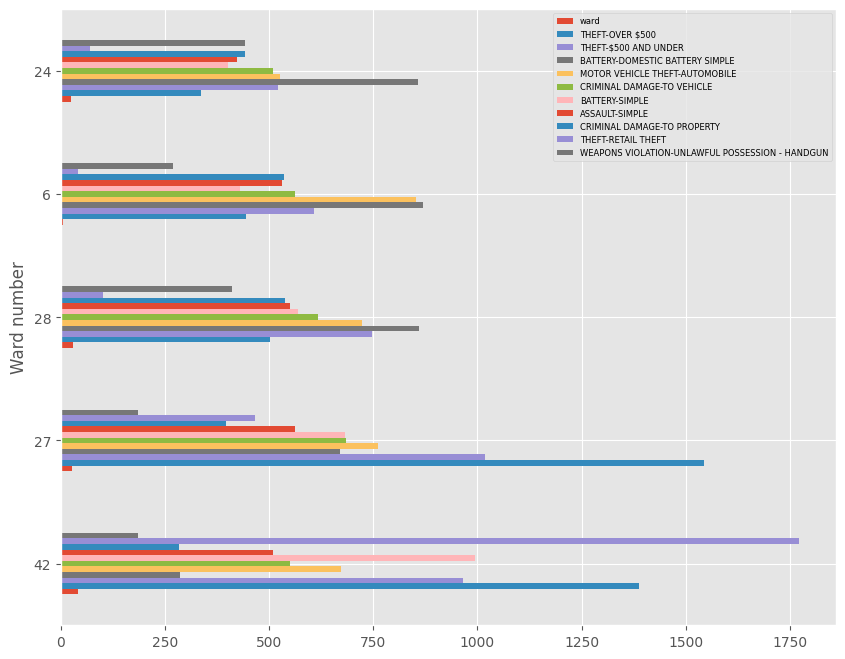

In [200]:
ax = df_to_plot.plot(kind='barh',figsize=(10,8))
ax.set_yticklabels(labels=df_to_plot['ward'])
ax.set_ylabel('Ward number')
plt.legend(loc = 1,prop={'size':6})

WTF is it plotting the index ("ward") as one of the bars?

And the colors repeat.

And the legend is reversed from the order of the bars on the chart

Let's fix all of these:

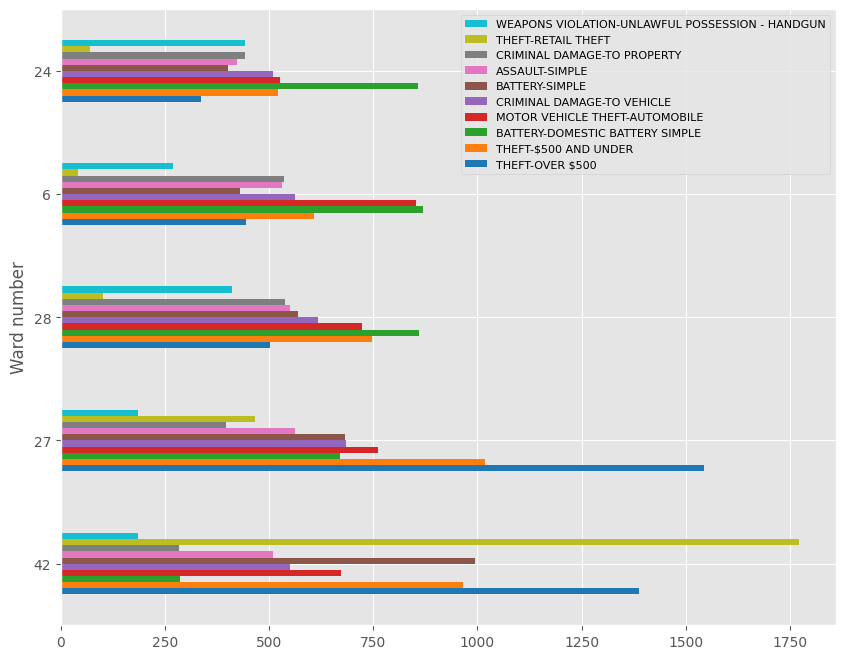

In [232]:
ax = df_to_plot.plot(kind='barh',
    figsize=(10,8),
    y = list(common_crimes['iucr_desc']),
    colormap = 'tab10'
    )
ax.set_yticklabels(labels=df_to_plot['ward'])
ax.set_ylabel('Ward number')
handles,labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles),reversed(labels),loc = 1, prop = {'size':8})

# https://matplotlib.org/stable/tutorials/colors/colormaps.html
# https://stackoverflow.com/questions/35373714/reverse-legend-order-pandas-plot


Ward 42 (Loop, River North) = areas with lots of tourists and ritzy stores ahs a very different pattern of crimes reported than does 

Ward 24 (North Lawnsdale = West central, w of Douglas Park) is 85% Black and 10% Hispanic. Lower income.

Crimes in 42 are dominated by retail theft and theft > $500, with theft < $500 and simple battery following.

In 24, most crimes are "domestic battery", then (almost equal), theft < $500, auto theft, damage to vehicle.

Where are homocides happening?

In [252]:
data[data['desc1'] == 'HOMICIDE']

,case#,date,block,iucr,desc1,desc2,location_desc,arrest,domestic,beat,ward,fbi cd,latitude,longitude,location,dt,iucr_desc
134,JF460063,11/03/2022 12:40:00 AM,034XX W LAKE ST,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,N,N,1123,28.0,01A,41.884713,-87.712452,"(41.884713074, -87.712452377)",2022-11-03 00:40:00,HOMICIDE-FIRST DEGREE MURDER
669,JF408241,09/23/2022 10:07:00 PM,033XX W NORTH AVE,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,Y,N,1422,26.0,01A,41.910075,-87.709922,"(41.910075348, -87.709921551)",2022-09-23 22:07:00,HOMICIDE-FIRST DEGREE MURDER
671,JF504574,12/09/2022 08:34:00 PM,006XX E 40TH ST,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,N,N,214,4.0,01A,41.821450,-87.611190,"(41.821450407, -87.611190417)",2022-12-09 20:34:00,HOMICIDE-FIRST DEGREE MURDER
726,JF473502,11/13/2022 06:32:00 PM,002XX S LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,Y,N,1522,29.0,01A,41.878245,-87.754989,"(41.878244691, -87.754988896)",2022-11-13 18:32:00,HOMICIDE-FIRST DEGREE MURDER
728,JF408430,09/24/2022 02:05:00 AM,118XX S HALE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,YARD,Y,N,2212,34.0,01A,41.678617,-87.673076,"(41.678616627, -87.673076099)",2022-09-24 02:05:00,HOMICIDE-FIRST DEGREE MURDER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14865,JF407078,09/22/2022 10:35:00 PM,042XX S ALBANY AVE,0141,HOMICIDE,INVOLUNTARY MANSLAUGHTER,RESIDENCE,N,N,921,15.0,01B,41.816976,-87.701856,"(41.816976324, -87.70185583)",2022-09-22 22:35:00,HOMICIDE-INVOLUNTARY MANSLAUGHTER
33599,JF414810,09/28/2022 08:53:00 PM,032XX W 31ST ST,0142,HOMICIDE,RECKLESS HOMICIDE,STREET,Y,N,1032,12.0,01B,41.837218,-87.705437,"(41.837218499, -87.705436604)",2022-09-28 20:53:00,HOMICIDE-RECKLESS HOMICIDE
177638,JF119156,01/20/2022 06:13:00 PM,075XX W TOUHY AVE,0142,HOMICIDE,RECKLESS HOMICIDE,STREET,Y,N,1611,41.0,01B,42.011473,-87.815727,"(42.011472877, -87.815726729)",2022-01-20 18:13:00,HOMICIDE-RECKLESS HOMICIDE
177784,JF211139,04/18/2022 12:28:00 AM,034XX S CALIFORNIA AVE,0142,HOMICIDE,RECKLESS HOMICIDE,STREET,Y,N,911,12.0,01B,41.831990,-87.694869,"(41.831990039, -87.69486863)",2022-04-18 00:28:00,HOMICIDE-RECKLESS HOMICIDE


Let's plot this data on a map, too. Since there 712 rows, we can either plot it as points or as clusters...

In [245]:
data.columns

Index(['case#', 'date', 'block', 'iucr', 'desc1', 'desc2', 'location_desc',
       'arrest', 'domestic', 'beat', 'ward', 'fbi cd', 'latitude', 'longitude',
       'location', 'dt', 'iucr_desc'],
      dtype='object')

In [256]:
data[data['desc1'] == 'HOMICIDE']['desc2'].value_counts()

FIRST DEGREE MURDER         707
RECKLESS HOMICIDE             3
INVOLUNTARY MANSLAUGHTER      1
SECOND DEGREE MURDER          1
Name: desc2, dtype: int64

In [264]:
m3 = folium.Map(location=[data['latitude'].mean(),data['longitude'].mean()],tiles='Stamen Terrain',zoom_start = 10)
# 
from folium.plugins import MarkerCluster
marker_cluster = folium.plugins.MarkerCluster().add_to(m3)

for idx,row in data[data['desc1'] == 'HOMICIDE'].iterrows():
    lat, lon = row.latitude, row.longitude
    folium.CircleMarker(location=[lat,lon],
        color = 'red',
        fill = True,
        fill_opacity = 1,
        radius = 5
        ).add_to(marker_cluster)

m3

In this case, the clusters make it hard to look at the city and determine where homicides are taking place. Let's try the map with just points. . .

In [275]:
m4 = folium.Map(location=[data['latitude'].mean(),data['longitude'].mean()],tiles='Stamen Terrain',zoom_start = 10)
# 

for idx,row in data[data['desc1'] == 'HOMICIDE'].iterrows():
    lat, lon = row.latitude, row.longitude
    folium.CircleMarker(location=[lat,lon],
        color = 'red',
        fill = True,
        fill_opacity = 1,
        radius = 2,
        popup=f"When:{row['dt'].strftime('%a, %d-%b-%y')} \n{row['dt'].strftime('%H:%M')}",
        ).add_to(m4)

m4

In [278]:
data['desc1'].value_counts()[:50]

THEFT                                54294
BATTERY                              40857
CRIMINAL DAMAGE                      27204
MOTOR VEHICLE THEFT                  21464
ASSAULT                              20776
DECEPTIVE PRACTICE                   15087
OTHER OFFENSE                        14301
ROBBERY                               8971
WEAPONS VIOLATION                     8759
BURGLARY                              7569
CRIMINAL TRESPASS                     4217
NARCOTICS                             3989
OFFENSE INVOLVING CHILDREN            1875
CRIMINAL SEXUAL ASSAULT               1505
SEX OFFENSE                           1175
HOMICIDE                               712
PUBLIC PEACE VIOLATION                 705
ARSON                                  421
STALKING                               421
INTERFERENCE WITH PUBLIC OFFICER       392
PROSTITUTION                           283
LIQUOR LAW VIOLATION                   202
INTIMIDATION                           178
CONCEALED C

In [279]:
data[data['desc1'] == 'ASSAULT']['desc2'].value_counts()

SIMPLE                                                        13158
AGGRAVATED - HANDGUN                                           4665
AGGRAVATED - KNIFE / CUTTING INSTRUMENT                        1336
AGGRAVATED - OTHER DANGEROUS WEAPON                             977
PROTECTED EMPLOYEE - HANDS, FISTS, FEET, NO / MINOR INJURY      229
AGGRAVATED - OTHER FIREARM                                      144
AGGRAVATED POLICE OFFICER - HANDS, FISTS, FEET, NO INJURY        94
AGGRAVATED POLICE OFFICER - OTHER DANGEROUS WEAPON               45
AGGRAVATED POLICE OFFICER - HANDGUN                              42
AGGRAVATED PROTECTED EMPLOYEE - HANDGUN                          26
AGGRAVATED PROTECTED EMPLOYEE - OTHER DANGEROUS WEAPON           24
AGGRAVATED PROTECTED EMPLOYEE - KNIFE / CUTTING INSTRUMENT       20
AGGRAVATED PROTECTED EMPLOYEE - OTHER FIREARM                     6
AGGRAVATED POLICE OFFICER - KNIFE / CUTTING INSTRUMENT            5
AGGRAVATED POLICE OFFICER - OTHER FIREARM       

In [280]:
data[data['desc1'] == 'BATTERY']['desc2'].value_counts()

DOMESTIC BATTERY SIMPLE                                         18620
SIMPLE                                                          13674
AGGRAVATED - HANDGUN                                             2116
AGGRAVATED - OTHER DANGEROUS WEAPON                              1622
AGGRAVATED DOMESTIC BATTERY - OTHER DANGEROUS WEAPON              967
AGG. DOMESTIC BATTERY - HANDS, FISTS, FEET, SERIOUS INJURY        803
AGGRAVATED - KNIFE / CUTTING INSTRUMENT                           696
AGGRAVATED DOMESTIC BATTERY - KNIFE / CUTTING INSTRUMENT          493
AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MINOR INJURY           438
PROTECTED EMPLOYEE - HANDS, FISTS, FEET, NO / MINOR INJURY        394
AGGRAVATED OF A SENIOR CITIZEN                                    327
AGGRAVATED - HANDS, FISTS, FEET, NO / MINOR INJURY                213
AGGRAVATED - HANDS, FISTS, FEET, SERIOUS INJURY                   133
AGGRAVATED OF A CHILD                                              79
AGGRAVATED POLICE OF

In [281]:
data[data['desc1'] == 'WEAPONS VIOLATION']['desc2'].value_counts()

UNLAWFUL POSSESSION - HANDGUN                    5418
RECKLESS FIREARM DISCHARGE                       2462
UNLAWFUL USE - OTHER FIREARM                      361
UNLAWFUL USE - HANDGUN                            284
UNLAWFUL USE - OTHER DANGEROUS WEAPON              64
UNLAWFUL POSSESSION - OTHER FIREARM                59
UNLAWFUL POSSESSION - AMMUNITION                   55
POSSESS FIREARM / AMMUNITION - NO FOID CARD        30
UNLAWFUL USE / SALE OF AIR RIFLE                   22
UNLAWFUL SALE - DELIVERY OF FIREARM AT SCHOOL       2
DEFACE IDENTIFICATION MARKS OF FIREARM              1
UNLAWFUL SALE - HANDGUN                             1
Name: desc2, dtype: int64

<AxesSubplot: >

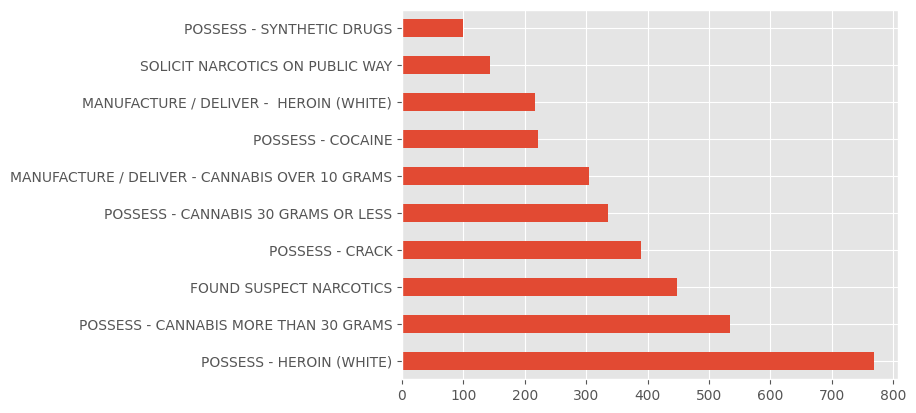

In [286]:
data[data['desc1'] == 'NARCOTICS']['desc2'].value_counts()[:10].plot(kind='barh')

row['dt'].strftime('%a, %d-%b-%y')} \n{row['dt'].strftime('%H:%M')

<AxesSubplot: >

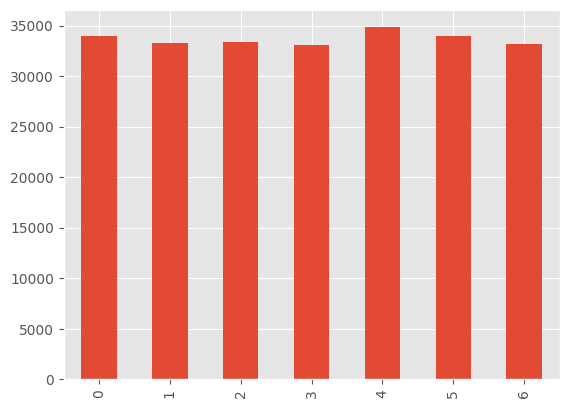

In [297]:
data['dt'].dt.day_of_week.value_counts().sort_index().plot(kind='bar')

Crime is pretty uniform across DOW. Bit higher on Thursday. 

<AxesSubplot: >

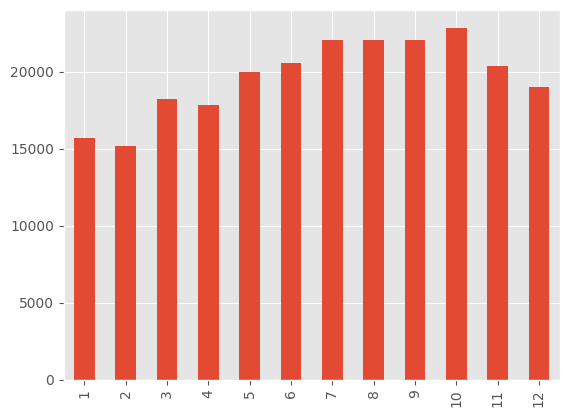

In [298]:
data['dt'].dt.month.value_counts().sort_index().plot(kind='bar')

Crime is much lower in colder months (Jan, Feb).
Highest from July to Oct.
Odd -- I would expect it to decrease in Sept and peak from June - Aug.

<AxesSubplot: >

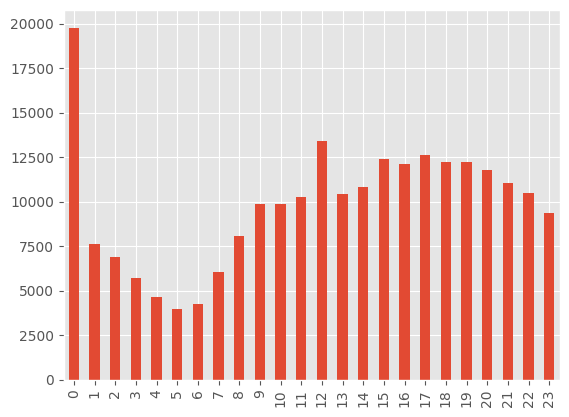

In [299]:
data['dt'].dt.hour.value_counts().sort_index().plot(kind='bar')

Midnight to 1 AM is a massive outlier -- I can't believe there are 2x as many crimes as from 11-midnight (here: 23). This must be a default value when police are recording information. Ditto the noon hour.

<AxesSubplot: >

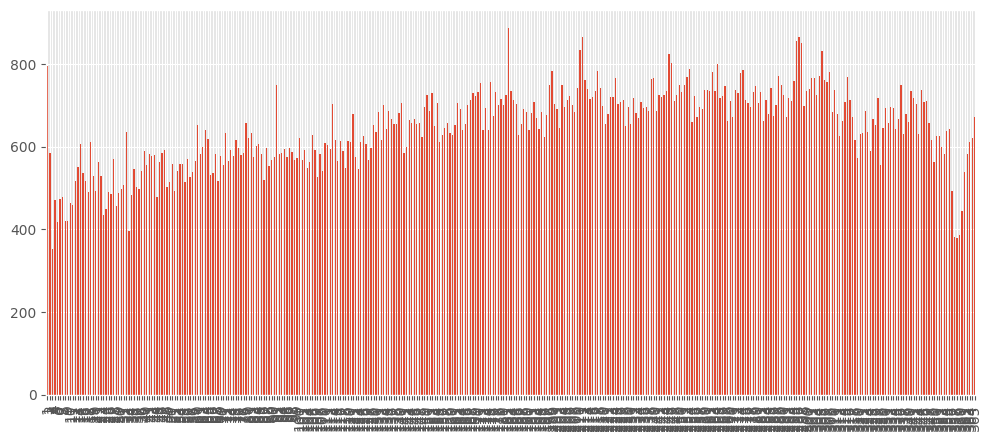

In [303]:
data['dt'].dt.day_of_year.value_counts().sort_index().plot(kind='bar',figsize=(12,5))

This is a more detailed version of the monthly, since it has entries for each day of the year. Interesting to note the dip just before the end of the year. Apparently, crimes drops (or at least isn't as reported) around christmas time!

In [305]:
pd.options.plotting.backend = "plotly"
data['dt'].dt.day_of_year.value_counts().sort_index().plot(kind='bar')

In [340]:
data[data['desc1']=='PROSTITUTION']['dt'].dt.strftime('%w').value_counts().sort_index().plot(kind = 'bar')

Weird. Prostitutes get arrested more on Wed than any other DOW. 

Monday there are no arrests! And Friday is pretty low, too. But Sunday his higher than Fri or Sat. Perhaps this refelcts when they get processed by the PD?

In [329]:
data[data['desc2'] == 'DOMESTIC BATTERY SIMPLE']['dt'].dt.day_of_week.value_counts().sort_index().plot(kind='bar')

This fits the pattern I would expect: domestic battery jumps on Fri, Sat, Sun.

In [334]:
data[data['desc2'] == 'DOMESTIC BATTERY SIMPLE']['dt'].dt.month.value_counts().sort_index().plot(kind='bar')

Domestic battery is higher from May - August.

In [321]:
data[data['desc2'] == 'DOMESTIC BATTERY SIMPLE']['dt'].dt.hour.value_counts().sort_index().plot(kind='bar')

In [322]:
data[data['desc1'] == 'NARCOTICS']['desc2'].value_counts()

POSSESS - HEROIN (WHITE)                             769
POSSESS - CANNABIS MORE THAN 30 GRAMS                535
FOUND SUSPECT NARCOTICS                              448
POSSESS - CRACK                                      390
POSSESS - CANNABIS 30 GRAMS OR LESS                  336
MANUFACTURE / DELIVER - CANNABIS OVER 10 GRAMS       304
POSSESS - COCAINE                                    221
MANUFACTURE / DELIVER -  HEROIN (WHITE)              217
SOLICIT NARCOTICS ON PUBLIC WAY                      144
POSSESS - SYNTHETIC DRUGS                             99
POSSESS - PCP                                         84
MANUFACTURE / DELIVER - CRACK                         82
POSSESS - BARBITURATES                                62
POSSESS - HALLUCINOGENS                               52
MANUFACTURE / DELIVER - CANNABIS 10 GRAMS OR LESS     48
POSSESS - METHAMPHETAMINE                             35
POSSESS - HEROIN (TAN / BROWN TAR)                    33
POSSESS - AMPHETAMINES         

In [335]:
data[data['desc2'] == 'POSSESS - HEROIN (WHITE)']['dt'].dt.strftime('%U').value_counts().sort_index().plot(kind='bar')


This tracks arrests for white heroin, but grouped by week, which is easier to read. It seems like there was a lot of arrests early in the year, but it dropped a bit subsequently.

It uses the .strftime('%U') to get a value for the week in the year.